<p style="text-align: center; font-size: 22px;">
    Dimensionality reduction
    <br> Radwan Al Zoubi
    <br> Mays Nael Adeeb Abdel Rahman
</p>

<!DOCTYPE html>
<html lang="en">
<head>
    <meta charset="UTF-8">
    <meta http-equiv="X-UA-Compatible" content="IE=edge">
    <meta name="viewport" content="width=device-width, initial-scale=1.0">
    <style>
        body {
            font-family: Arial, sans-serif;
            margin: 20px;
            line-height: 1.6;
        }
        table {
            width: 100%;
            border-collapse: collapse;
            margin-top: 20px;
        }
        th, td {
            border: 1px solid #ddd;
            padding: 8px;
            text-align: left;
        }
        th {
            background-color: #f2f2f2;
        }
    </style>
</head>
<body>

<h1>1. Business Understanding</h1>

<h2>1.1 Context and Motivation</h2>
<p>
    "Distracted driving poses a severe risk not only to drivers but also to all road users. According to the National Highway Traffic Safety Administration (NHTSA), distracted driving claimed 3,308 lives in 2022 alone, highlighting the critical dangers associated with inattention while driving. Additionally, the CDC reports that every day, about nine people in the United States are killed, and over 1,000 are injured in crashes involving a distracted driver."
</p>
<p>
    The State Farm Distracted Driver Detection dataset aims to address one of the most critical issues in road safety: distracted driving. Distracted driving significantly contributes to road accidents, injuries, and fatalities, posing a severe threat to drivers, passengers, and pedestrians alike. With the increasing prevalence of smartphone use and other in-vehicle distractions, identifying and mitigating such behaviors is crucial for enhancing road safety.
</p>

<h2>1.2 Problem Statement</h2>
<p>
    The dataset consists of 22,424 colored images of drivers captured by dashcams during driving, each with a resolution of 480x640 pixels. These images are categorized into ten classes, each representing a distinct driving behavior, ranging from safe driving to various forms of distracted driving such as texting, talking on the phone, and other distractions. The primary goal is to create a classification algorithm capable of accurately identifying these behaviors in real time.
</p>

<h2>1.3 Potential Impact</h2>
<p>
    The deployment of an accurate image classification algorithm can significantly enhance vehicle safety systems, alerting drivers in real-time to correct unsafe behaviors. Such technologies could potentially be integrated into advanced driver-assistance systems (ADAS) or autonomous vehicles, reducing the risk of accidents caused by distracted driving and saving lives. Insurance companies like State Farm can also use these models to better understand driving behaviors, refine their risk assessments, and promote safer driving practices among their customers.
</p>

<h2>1.4 Dataset Overview</h2>
<p>
    The State Farm Distracted Driver Detection dataset comprises 22,424 images of drivers, each with varying dimensions and orientations. The images are classified into ten categories, each representing a specific type of driving behavior:
</p>

<table>
    <thead>
        <tr>
            <th>Category</th>
            <th>Description</th>
        </tr>
    </thead>
    <tbody>
        <tr>
            <td>c0</td>
            <td>Safe driving</td>
        </tr>
        <tr>
            <td>c1</td>
            <td>Texting - right hand</td>
        </tr>
        <tr>
            <td>c2</td>
            <td>Talking on the phone - right hand</td>
        </tr>
        <tr>
            <td>c3</td>
            <td>Texting - left hand</td>
        </tr>
        <tr>
            <td>c4</td>
            <td>Talking on the phone - left hand</td>
        </tr>
        <tr>
            <td>c5</td>
            <td>Operating the radio</td>
        </tr>
        <tr>
            <td>c6</td>
            <td>Drinking</td>
        </tr>
        <tr>
            <td>c7</td>
            <td>Reaching behind</td>
        </tr>
        <tr>
            <td>c8</td>
            <td>Hair and makeup</td>
        </tr>
        <tr>
            <td>c9</td>
            <td>Talking to a passenger</td>
        </tr>
    </tbody>
</table>

<h2>1.5 Objective and Goals</h2>
<p>
    The primary goal is to develop an image classification algorithm that can accurately detect distracted driving behaviors with a minimum accuracy threshold of 95%. A critical aspect of this goal is minimizing false negatives—instances where distracted behaviors are incorrectly classified as safe driving. Reducing false negatives is crucial, as these errors pose significant safety risks by failing to alert drivers when they are engaging in dangerous activities. Achieving high accuracy and minimizing false negatives will enable the implementation of real-time driver monitoring systems that can effectively alert drivers to correct their behaviors, ultimately enhancing road safety.
</p>

</body>
</html>

<h4>Dataset Url</h4>
Kaggle. State Farm Distracted Driver Detection Dataset:<a href="https://www.kaggle.com/competitions/state-farm-distracted-driver-detection/code">https://www.kaggle.com/competitions/state-farm-distracted-driver-detection/code</a>

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import os
import cv2
import pandas as pd
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, mean_squared_error
from sklearn.metrics.pairwise import pairwise_distances
from sklearn.decomposition import PCA, IncrementalPCA
from skimage import data, transform, io, color
from skimage.color import rgb2gray
from skimage.feature import match_descriptors, daisy, plot_matches, corner_shi_tomasi, corner_peaks
from scipy.sparse import lil_matrix, csr_matrix
import plotly.express as px
from plotly.graph_objs import Bar, Scatter, Layout
from plotly.graph_objs.layout import XAxis, YAxis
import warnings
import copy
from skimage.transform import resize
import plotly



# Configuration settings
warnings.filterwarnings('ignore')
plt.rcParams["axes.grid"] = False
%matplotlib inline


<!DOCTYPE html>
<html lang="en">
<head>
    <meta charset="UTF-8">
    <meta http-equiv="X-UA-Compatible" content="IE=edge">
    <meta name="viewport" content="width=device-width, initial-scale=1.0">
    <style>
        body {
            font-family: Arial, sans-serif;
            margin: 20px;
            line-height: 1.6;
        }
        table {
            width: 100%;
            border-collapse: collapse;
            margin-top: 20px;
        }
        th, td {
            border: 1px solid #ddd;
            padding: 8px;
            text-align: left;
        }
        th {
            background-color: #f2f2f2;
        }
    </style>
</head>
<body>

<h1>2. Data Preparation</h1>

<h2>2.1 Reading and Resizing Images</h2>
<p>
    We processed 22,424 images, resizing them from their original 480x640 pixels to 265x265 pixels and converting them to grayscale to simplify the data. This step helps reduce computational complexity while retaining the essential features required for classification.
</p>

</body>
</html>

In [4]:
dataset_path = 'imgs/train'
img_height, img_width = 265, 265
def load_images_from_folder(folder):
    images = []
    labels = []
    for class_folder in os.listdir(folder):
        class_path = os.path.join(folder, class_folder)
        if not os.path.isdir(class_path):
            continue
        for filename in os.listdir(class_path):
            img_path = os.path.join(class_path, filename)
            img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)  
            if img is not None:
                # Resize the image to the desired dimensions
                img = cv2.resize(img, (img_width, img_height))
                images.append(img)
                labels.append(class_folder)
    return np.array(images), np.array(labels)
images, labels = load_images_from_folder(dataset_path)

<h2>2.2 Linearizing Images</h2>
<p>
    Each grayscale image was flattened into a one-dimensional array, with the target class label added at the end. This transformation enables efficient training and testing of the classification model, ensuring that the data is structured appropriately for learning algorithms.
</p>



In [5]:
image_features = images.reshape(len(images), -1)
df = pd.DataFrame(image_features)
df['label'] = labels
print (df.info())
df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22424 entries, 0 to 22423
Columns: 70226 entries, 0 to label
dtypes: object(1), uint8(70225)
memory usage: 1.5+ GB
None


,0,1,2,3,4,5,6,7,8,9,...,70216,70217,70218,70219,70220,70221,70222,70223,70224,label
0,32,36,34,43,39,35,38,41,43,29,...,16,14,14,11,11,15,16,8,10,c0
1,43,39,40,42,42,43,44,41,41,43,...,9,9,9,7,7,9,8,47,102,c0
2,48,48,48,48,48,48,48,49,49,49,...,10,8,9,10,10,10,7,57,108,c0
3,40,38,37,35,33,32,32,33,33,33,...,7,7,7,8,9,7,8,7,6,c0
4,12,11,12,13,11,12,13,12,13,14,...,8,10,10,9,8,8,7,20,18,c0


<h2>2.3 Visualizing Images</h2>
<p>
    Sample images were visualized after resizing and converting to grayscale to ensure the preprocessing steps preserved key features necessary for distinguishing between different driving behaviors. This verification helps validate that the data retains its integrity and that the model will be able to identify crucial patterns in the images.
</p>

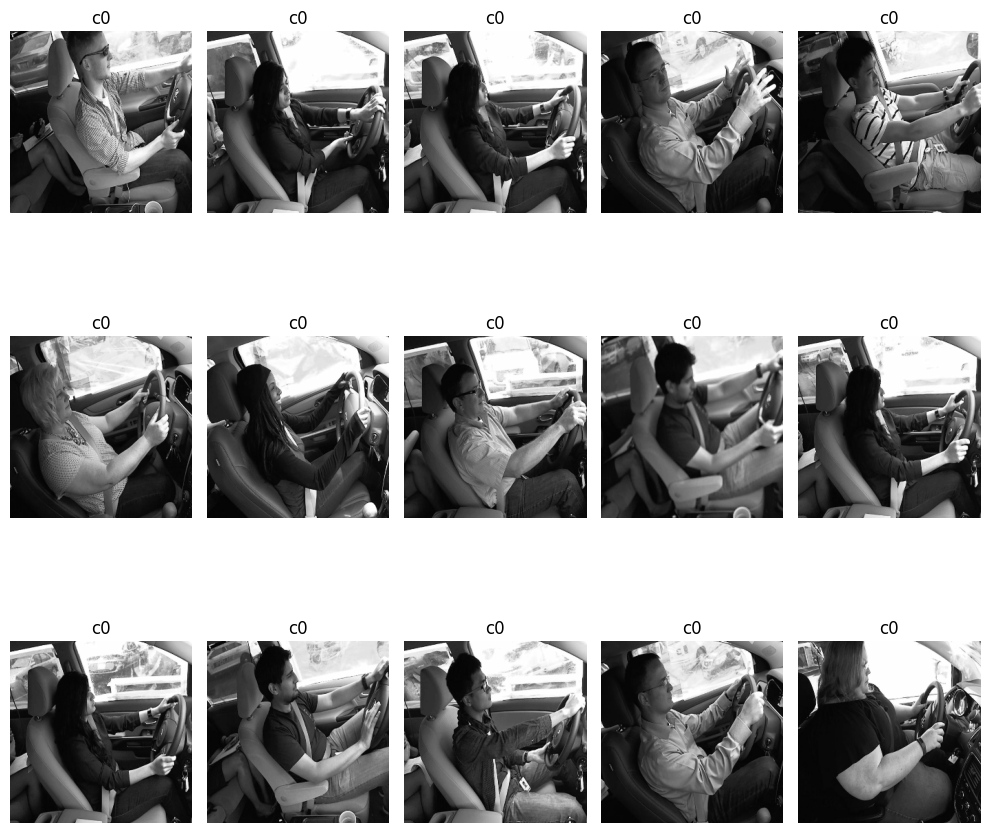

Loaded 22424 images.
Each image is reshaped to 1-D array of length: 70225


In [5]:
plt.figure(figsize=(10, 10))
for i in range(15):  
    img_reshaped = image_features[i].reshape(img_height, img_width)
    plt.subplot(3, 5, i + 1)
    plt.imshow(img_reshaped, cmap='gray') 
    plt.title(labels[i])
    plt.axis('off')
plt.tight_layout()
plt.show()

print(f"Loaded {len(images)} images.")
print(f"Each image is reshaped to 1-D array of length: {image_features.shape[1]}")


<!DOCTYPE html>
<html lang="en">
<head>
    <meta charset="UTF-8">
    <meta http-equiv="X-UA-Compatible" content="IE=edge">
    <meta name="viewport" content="width=device-width, initial-scale=1.0">
    <style>
        body {
            font-family: Arial, sans-serif;
            margin: 20px;
            line-height: 1.6;
        }
        table {
            width: 100%;
            border-collapse: collapse;
            margin-top: 20px;
        }
        th, td {
            border: 1px solid #ddd;
            padding: 8px;
            text-align: left;
        }
        th {
            background-color: #f2f2f2;
        }
    </style>
</head>
<body>

<h1>3. Data Reduction</h1>

<h2>3.1  Principal Components Analysis</h2>
<p>
    In this analysis, we performed linear dimensionality reduction on image data using Principal Component Analysis (PCA). The goal was to determine how many dimensions are required to adequately represent the data while maintaining computational efficiency. Initially, PCA was applied with 822 components, and the explained variance ratio for each component was visualized to assess how much variance each captures. </p>

</body>
</html>

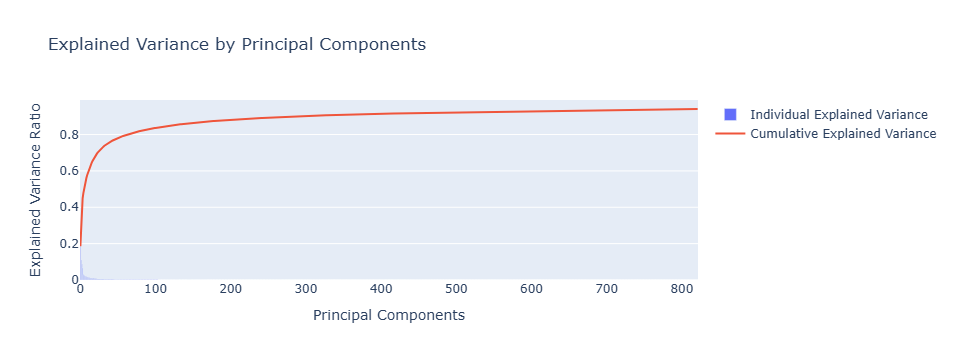

In [6]:

n_component=822
pca = PCA(n_components=n_component)  
pca.fit(image_features.copy())
def plot_explained_variance(pca):
    explained_var = pca.explained_variance_ratio_
    cum_var_exp = np.cumsum(explained_var)
    
    plotly.offline.iplot({
        "data": [Bar(y=explained_var, name='Individual Explained Variance'),
                 Scatter(y=cum_var_exp, name='Cumulative Explained Variance')],
        "layout": Layout(
            title='Explained Variance by Principal Components',
            xaxis=XAxis(title='Principal Components'),
            yaxis=YAxis(title='Explained Variance Ratio'),
            showlegend=True
        )
    })

plot_explained_variance(pca)

<p>By examining the cumulative explained variance plot, we found that reducing the number of features from 70,225 to 822 achieved an explained variance ratio of 94%. This reduction highlights that most of the critical information in the data is captured with significantly fewer components, effectively filtering out noise and redundant features. Beyond 822 components, the variance gain becomes minimal, indicating diminishing returns. Thus, 822 components sufficiently represent the core data patterns, optimizing computational efficiency while maintaining data integrity.</p>

<h4>- Visualizing Eigenimages</h4>
<p>
Eigenimages, representing principal components, were visualized to reveal the key patterns captured by PCA, such as edges, textures, and shapes. The first few components highlight prominent features like overall structure and lighting, while later components capture finer details. This visualization helps to understand how PCA prioritizes and preserves essential information in the images, illustrating the decomposition of complex visuals into fundamental features.</p>

In [11]:
def plot_gallery(images, titles, h, w, n_row=3, n_col=5):
    """Helper function to plot a gallery of portraits"""
    plt.figure(figsize=(1.7 * n_col, 2.3 * n_row))
    plt.subplots_adjust(bottom=0, left=.01, right=.99, top=.90, hspace=.35)
    for i in range(n_row * n_col):
        plt.subplot(n_row, n_col, i + 1)
        plt.imshow(images[i].reshape((h, w)), cmap=plt.cm.gray)
        plt.title(titles[i], size=12)
        plt.xticks(())
        plt.yticks(())

In [12]:
eigenimages = pca.components_.reshape((n_component,img_height, img_width))

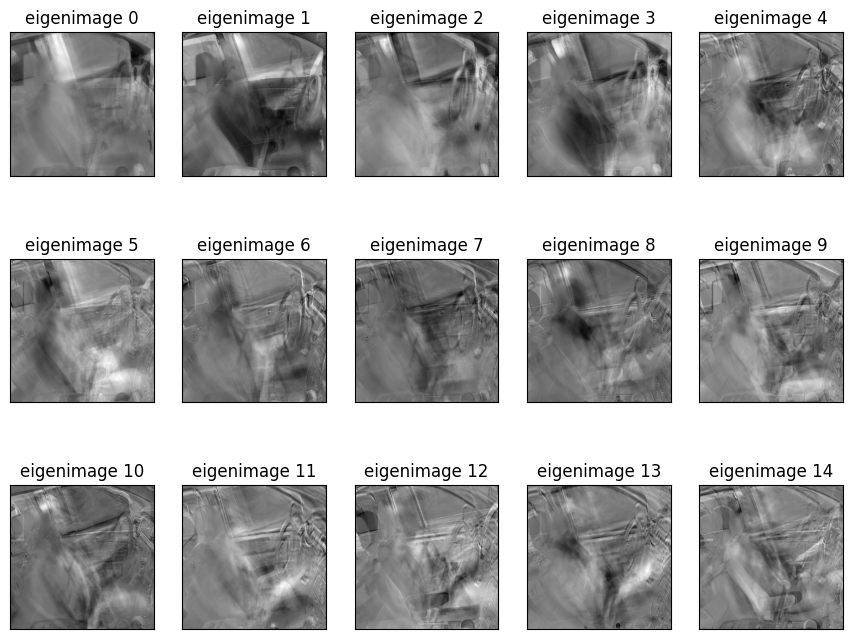

In [13]:
eigenface_titles = ["eigenimage %d" % i for i in range(eigenimages.shape[0])]
plot_gallery(eigenimages, eigenface_titles, img_height, img_width)

<h4>- Image reconstrction using PCA</h4>
<p>Randomly selected images were reconstructed from their lower-dimensional representations, and both the original and reconstructed images were displayed to visually assess the quality of the dimensionality reduction. To quantify the reconstruction loss, the Root Mean Squared Error (RMSE) between the original and reconstructed images was calculated. The analysis determined that choosing the optimal number of components based on a 94% explained variance threshold effectively balances preserving the maximum data variance while minimizing complexity. This approach identifies the fewest components needed to accurately represent the data, enhancing computational efficiency without significant loss of information.
</p>

In [21]:
def reconstruct_image(trans_obj, org_features):
    low_rep = trans_obj.transform(org_features)
    rec_image = trans_obj.inverse_transform(low_rep)
    return low_rep, rec_image

The root mean squared reconstruction error for first image is: 13.422127943636163
The root mean squared reconstruction error for second image is: 12.722894524220003
The root mean squared reconstruction error for third image is: 87.90166786797194


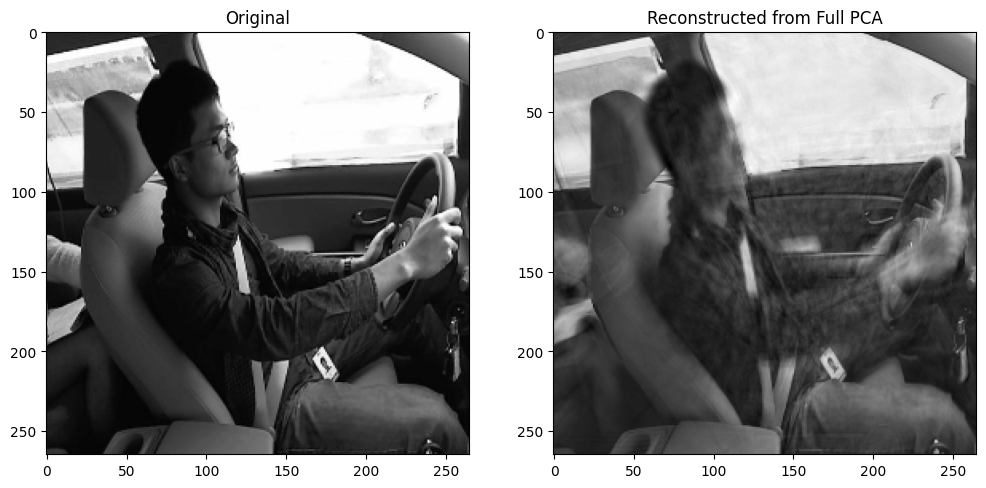

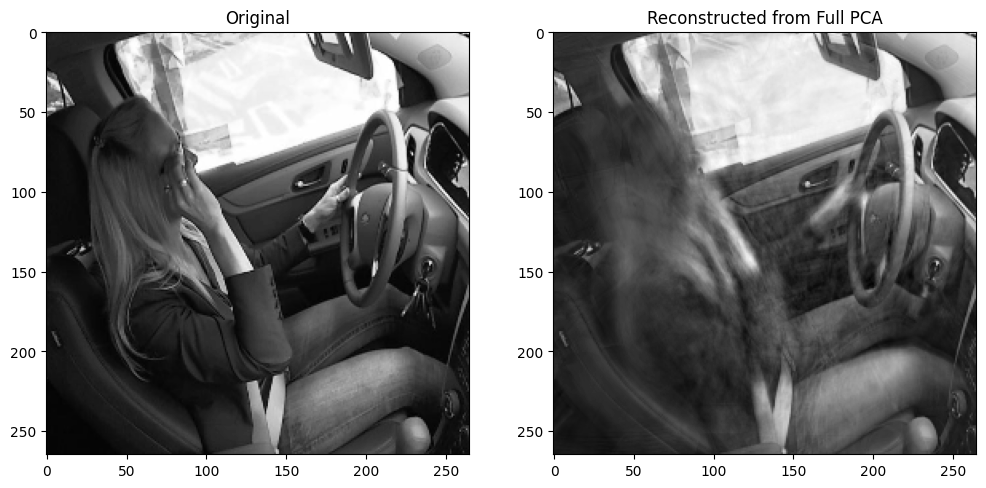

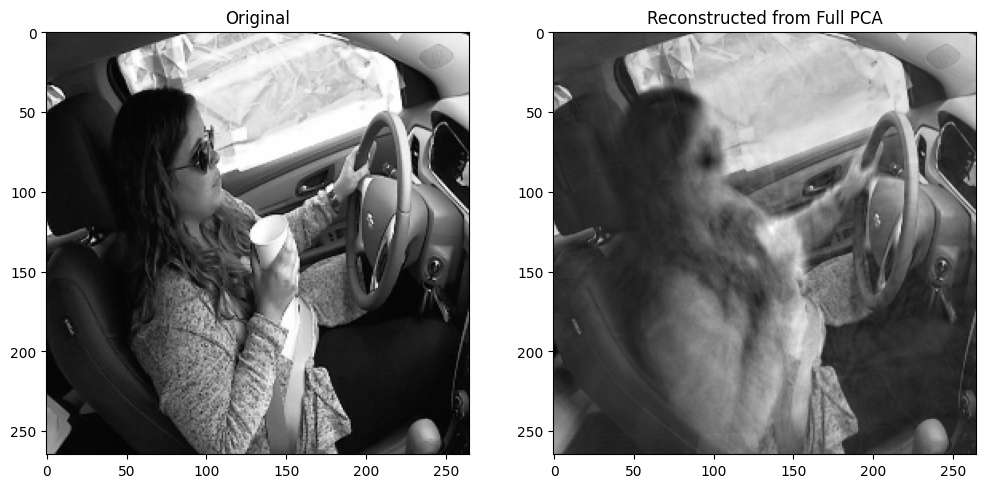

In [22]:
idx_to_reconstruct = 200 
image_feature = image_features[idx_to_reconstruct]
low_dimensional_representation, reconstructed_image = reconstruct_image(pca,image_feature.reshape(1, -1))
plt.figure(figsize=(12,12))
plt.subplot(1,2,1)
plt.imshow(image_feature.reshape((img_height, img_width)), cmap=plt.cm.gray)
plt.title('Original')
plt.grid(False)
plt.subplot(1,2,2)
plt.imshow(reconstructed_image.reshape((img_height, img_width)), cmap=plt.cm.gray)
plt.title('Reconstructed from Full PCA')
plt.grid(False)
rmse = root_mean_squared_error(image_feature.reshape((img_height, img_width)), reconstructed_image.reshape((img_height, img_width)))
print("The root mean squared reconstruction error for first image is:" ,rmse)

idx_to_reconstruct2 = 20000 
image_feature2 = image_features[idx_to_reconstruct2]
low_dimensional_representation, reconstructed_image2 = reconstruct_image(pca,image_feature2.reshape(1, -1))
plt.figure(figsize=(12,12))
plt.subplot(1,2,1)
plt.imshow(image_feature2.reshape((img_height, img_width)), cmap=plt.cm.gray)
plt.title('Original')
plt.grid(False)
plt.subplot(1,2,2)
plt.imshow(reconstructed_image2.reshape((img_height, img_width)), cmap=plt.cm.gray)
plt.title('Reconstructed from Full PCA')
plt.grid(False)
rmse = root_mean_squared_error(image_feature2.reshape((img_height, img_width)), reconstructed_image2.reshape((img_height, img_width)))
print("The root mean squared reconstruction error for second image is:" ,rmse)

idx_to_reconstruct3 = 15015 
image_feature3 = image_features[idx_to_reconstruct3]
low_dimensional_representation, reconstructed_image3 = reconstruct_image(pca,image_feature3.reshape(1, -1))
plt.figure(figsize=(12,12))
plt.subplot(1,2,1)
plt.imshow(image_feature3.reshape((img_height, img_width)), cmap=plt.cm.gray)
plt.title('Original')
plt.grid(False)
plt.subplot(1,2,2)
plt.imshow(reconstructed_image3.reshape((img_height, img_width)), cmap=plt.cm.gray)
plt.title('Reconstructed from Full PCA')
plt.grid(False)
rmse = root_mean_squared_error(image_feature.reshape((img_height, img_width)), reconstructed_image3.reshape((img_height, img_width)))
print("The root mean squared reconstruction error for third image is:" ,rmse)

<h2>3.2 Randomized Principle Components Analysis</h2>
<p>
    In this analysis, we performed linear dimensionality reduction on image data using Randomized Principal Component Analysis (RPCA). Unlike standard PCA, which computes all components deterministically, RPCA leverages randomization techniques to approximate the principal components more quickly, making it particularly efficient for large datasets. The goal was to determine the number of dimensions required to represent the data effectively while maintaining computational efficiency. RPCA was initially applied with 822 components, and the explained variance ratio for each component was visualized to assess how much variance each captures. This approach helps identify the optimal number of components needed, balancing the accuracy of data representation with the reduced complexity, making RPCA a powerful alternative when working with large-scale image data.
</p>

CPU times: total: 1h 29min 8s
Wall time: 15min 27s


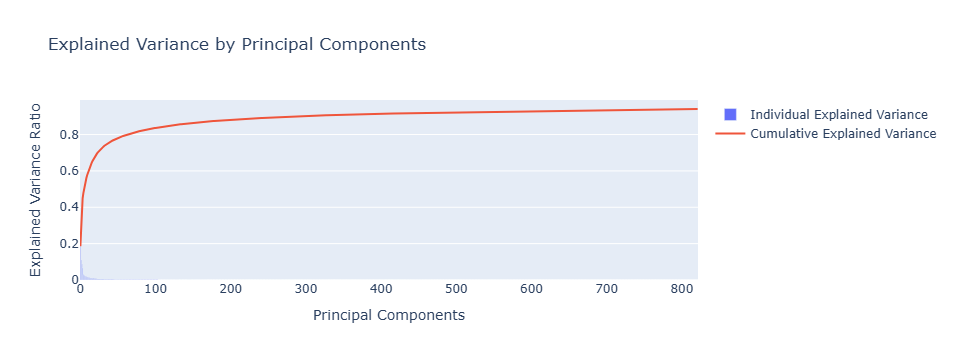

In [23]:
rpca = PCA(n_components=n_component, svd_solver='randomized')  # Maximum feasible components
%time rpca.fit(image_features.copy())
# Plot the explained variance
plot_explained_variance(rpca)


<h4>- Visualizing Eigenimages with Randomized PCA</h4>
<p>
Eigenimages, representing principal components derived from Randomized PCA (RPCA), were visualized to reveal the key patterns captured by the dimensionality reduction process, such as edges, textures, and shapes. The first few components highlight prominent features like overall structure, lighting, and dominant patterns, while later components capture finer details and subtler variations. This visualization helps to understand how RPCA efficiently prioritizes and preserves essential information in the images, illustrating how complex visuals are decomposed into fundamental features. RPCA’s use of randomization accelerates this process, making it well-suited for handling large datasets without compromising the interpretability of the key visual elements.</p>

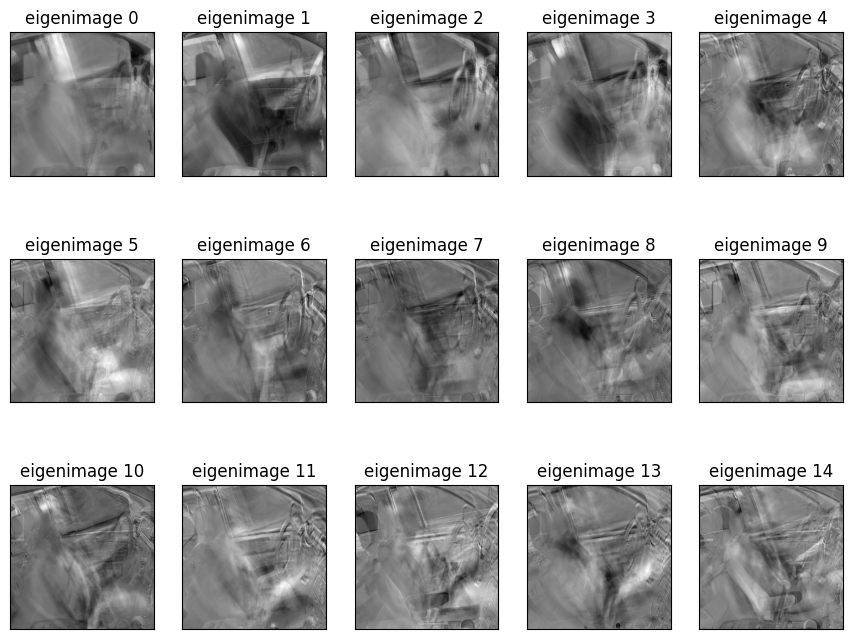

In [24]:
eigenimages = rpca.components_.reshape((n_component,img_height, img_width))
eigenface_titles = ["eigenimage %d" % i for i in range(eigenimages.shape[0])]
plot_gallery(eigenimages, eigenface_titles, img_height, img_width)

<h4>- Image Reconstruction Using Randomized PCA</h4>
<p>Randomly selected images were reconstructed from their lower-dimensional representations obtained through Randomized PCA (RPCA), and both the original and reconstructed images were displayed to visually assess the quality of the dimensionality reduction. To quantify the reconstruction loss, the Root Mean Squared Error (RMSE) between the original and reconstructed images was calculated. The analysis found that selecting the optimal number of components based on a 94% explained variance threshold effectively balances data fidelity with reduced complexity. RPCA’s accelerated approach allows this balance to be achieved efficiently, identifying the minimum number of components needed to accurately represent the data while enhancing computational efficiency without significant information loss.
</p>

The root mean squared reconstruction error for first image is: 12.507702877560272
The root mean squared reconstruction error for second image is: 11.927638638125217
The root mean squared reconstruction error for third image is: 85.76247847654686


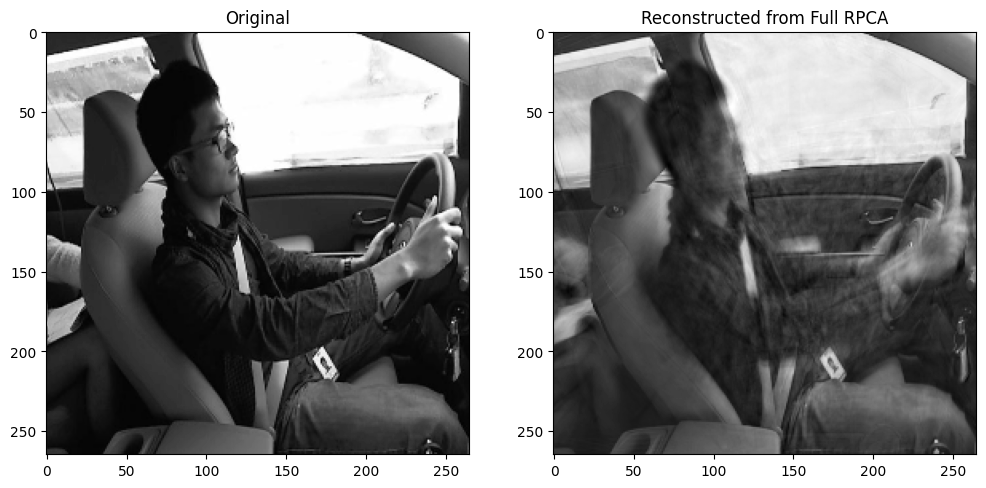

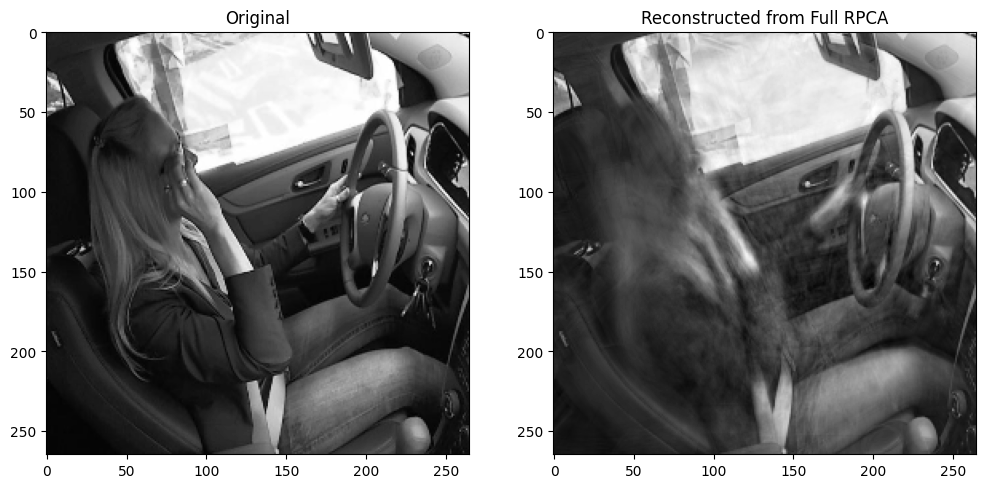

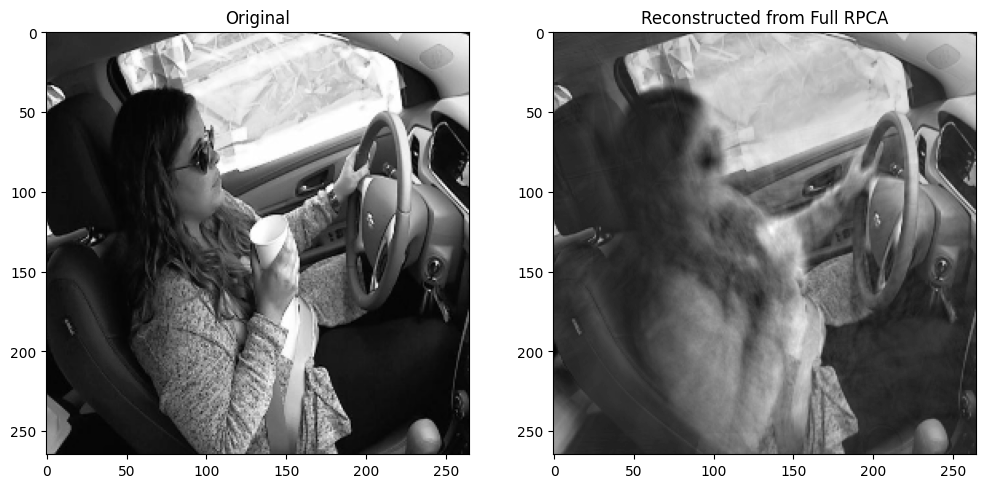

In [44]:
idx_to_reconstruct = 200 
image_feature = image_features[idx_to_reconstruct]
low_dimensional_representation, reconstructed_image = reconstruct_image(rpca,image_feature.reshape(1, -1))
plt.figure(figsize=(12,12))
plt.subplot(1,2,1)
plt.imshow(image_feature.reshape((img_height, img_width)), cmap=plt.cm.gray)
plt.title('Original')
plt.grid(False)
plt.subplot(1,2,2)
plt.imshow(reconstructed_image.reshape((img_height, img_width)), cmap=plt.cm.gray)
plt.title('Reconstructed from Full RPCA')
plt.grid(False)
rmse = root_mean_squared_error(image_feature.reshape((img_height, img_width)), reconstructed_image.reshape((img_height, img_width)))
print("The root mean squared reconstruction error for first image is:" ,rmse)

idx_to_reconstruct2 = 20000 
image_feature2 = image_features[idx_to_reconstruct2]
low_dimensional_representation, reconstructed_image2 = reconstruct_image(rpca,image_feature2.reshape(1, -1))
plt.figure(figsize=(12,12))
plt.subplot(1,2,1)
plt.imshow(image_feature2.reshape((img_height, img_width)), cmap=plt.cm.gray)
plt.title('Original')
plt.grid(False)
plt.subplot(1,2,2)
plt.imshow(reconstructed_image2.reshape((img_height, img_width)), cmap=plt.cm.gray)
plt.title('Reconstructed from Full RPCA')
plt.grid(False)
rmse = root_mean_squared_error(image_feature2.reshape((img_height, img_width)), reconstructed_image2.reshape((img_height, img_width)))
print("The root mean squared reconstruction error for second image is:" ,rmse)

idx_to_reconstruct3 = 15015 
image_feature3 = image_features[idx_to_reconstruct3]
low_dimensional_representation, reconstructed_image3 = reconstruct_image(rpca,image_feature3.reshape(1, -1))
plt.figure(figsize=(12,12))
plt.subplot(1,2,1)
plt.imshow(image_feature3.reshape((img_height, img_width)), cmap=plt.cm.gray)
plt.title('Original')
plt.grid(False)
plt.subplot(1,2,2)
plt.imshow(reconstructed_image3.reshape((img_height, img_width)), cmap=plt.cm.gray)
plt.title('Reconstructed from Full RPCA')
plt.grid(False)
rmse = root_mean_squared_error(image_feature.reshape((img_height, img_width)), reconstructed_image3.reshape((img_height, img_width)))
print("The root mean squared reconstruction error for third image is:" ,rmse)

<h2>3.3
Comparative Evaluation of PCA and Randomized PCA</h2>
<p>
In this section, PCA and Randomized PCA (RPCA) are compared based on their performance using 822 components. The goal is to evaluate how effectively each method represents the images with this reduced dimensionality. By examining the explained variance ratios and the reconstruction errors, we can determine which approach better captures the essential features of the data. The comparison will highlight the trade-offs between accuracy and computational efficiency, offering insights into which method provides a more optimal balance when limited to 822 components.
</p>

<h4>-Reconstructed images</h4>
<p>The reconstructed images obtained via PCA and Randomized PCA exhibit considerable similarity, with both methods efficiently capturing the primary structures of the images. PCA’s use of the full covariance matrix allows it to account for all variations within the data, ensuring that important features are preserved without the need for complex iterative procedures. While RPCA attempts to separate noise and outliers, this often results in a more computationally expensive and time-consuming process, with marginal improvements in image clarity for clean datasets.

PCA, on the other hand, is computationally faster and more efficient, making it the ideal choice for datasets where speed and resource efficiency are priorities. By capturing all components of variance, PCA ensures a faithful reconstruction of the images, particularly when noise levels are low. Thus, PCA’s full-spectrum approach provides a reliable and efficient representation, without the need for the additional complexity involved in RPCA, making it more advantageous in scenarios where computational speed and accuracy in clean data are prioritized.</p>

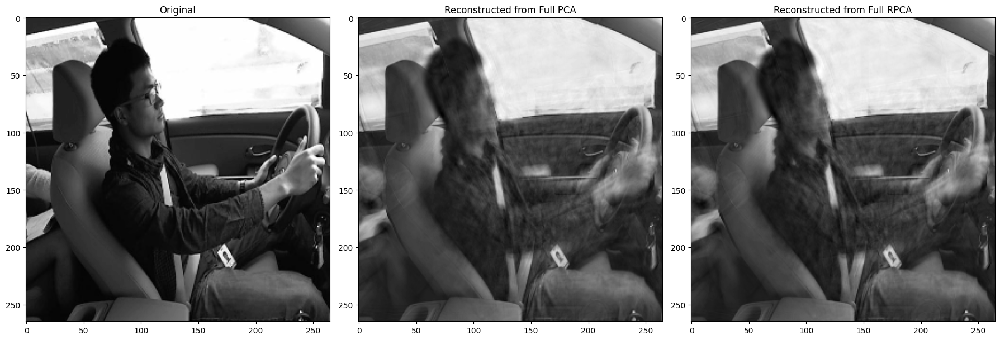

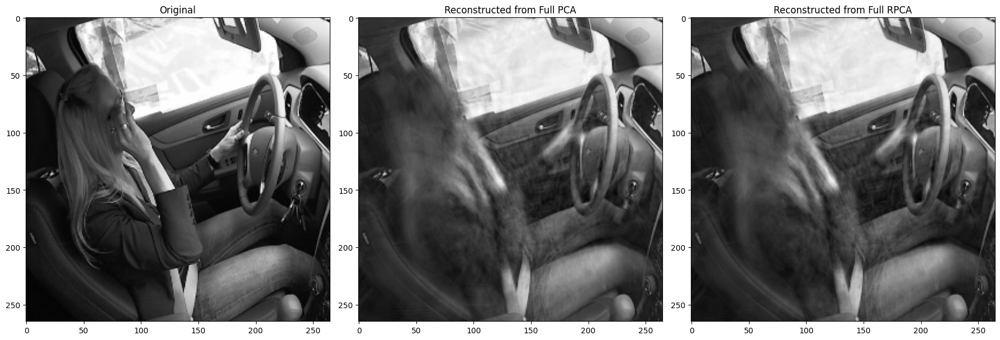

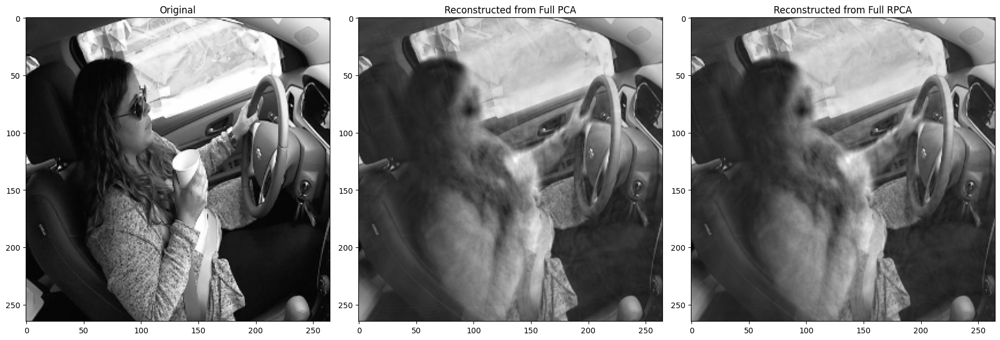

In [50]:
idx_to_reconstruct = 200
image_feature = image_features[idx_to_reconstruct]
low_dimensional_representation, reconstructed_image = reconstruct_image(pca, image_feature.reshape(1, -1))
r_low_dimensional_representation, r_reconstructed_image = reconstruct_image(rpca, image_feature.reshape(1, -1))
plt.figure(figsize=(18, 6))
plt.subplot(1, 3, 1)
plt.imshow(image_feature.reshape((img_height, img_width)), cmap=plt.cm.gray)
plt.title('Original')
plt.grid(False)
plt.subplot(1, 3, 2)
plt.imshow(reconstructed_image.reshape((img_height, img_width)), cmap=plt.cm.gray)
plt.title('Reconstructed from Full PCA')
plt.grid(False)
plt.subplot(1, 3, 3)
plt.imshow(r_reconstructed_image.reshape((img_height, img_width)), cmap=plt.cm.gray)
plt.title('Reconstructed from Full RPCA')
plt.grid(False)
plt.tight_layout() 
plt.show()

idx_to_reconstruct2 = 20000
image_feature2 = image_features[idx_to_reconstruct2]
low_dimensional_representation, reconstructed_image2 = reconstruct_image(pca, image_feature2.reshape(1, -1))
r_low_dimensional_representation, r_reconstructed_image2 = reconstruct_image(rpca, image_feature2.reshape(1, -1))
plt.figure(figsize=(18, 6))
plt.subplot(1, 3, 1)
plt.imshow(image_feature2.reshape((img_height, img_width)), cmap=plt.cm.gray)
plt.title('Original')
plt.grid(False)
plt.subplot(1, 3, 2)
plt.imshow(reconstructed_image2.reshape((img_height, img_width)), cmap=plt.cm.gray)
plt.title('Reconstructed from Full PCA')
plt.grid(False)
plt.subplot(1, 3, 3)
plt.imshow(r_reconstructed_image2.reshape((img_height, img_width)), cmap=plt.cm.gray)
plt.title('Reconstructed from Full RPCA')
plt.grid(False)
plt.tight_layout() 
plt.show()

idx_to_reconstruct3 = 15015
image_feature3 = image_features[idx_to_reconstruct3]
low_dimensional_representation, reconstructed_image3 = reconstruct_image(pca, image_feature3.reshape(1, -1))
r_low_dimensional_representation, r_reconstructed_image3 = reconstruct_image(rpca, image_feature3.reshape(1, -1))
plt.figure(figsize=(18, 6))
plt.subplot(1, 3, 1)
plt.imshow(image_feature3.reshape((img_height, img_width)), cmap=plt.cm.gray)
plt.title('Original')
plt.grid(False)
plt.subplot(1, 3, 2)
plt.imshow(reconstructed_image3.reshape((img_height, img_width)), cmap=plt.cm.gray)
plt.title('Reconstructed from Full PCA')
plt.grid(False)
plt.subplot(1, 3, 3)
plt.imshow(r_reconstructed_image3.reshape((img_height, img_width)), cmap=plt.cm.gray)
plt.title('Reconstructed from Full RPCA')
plt.grid(False)
plt.tight_layout() 
plt.show()

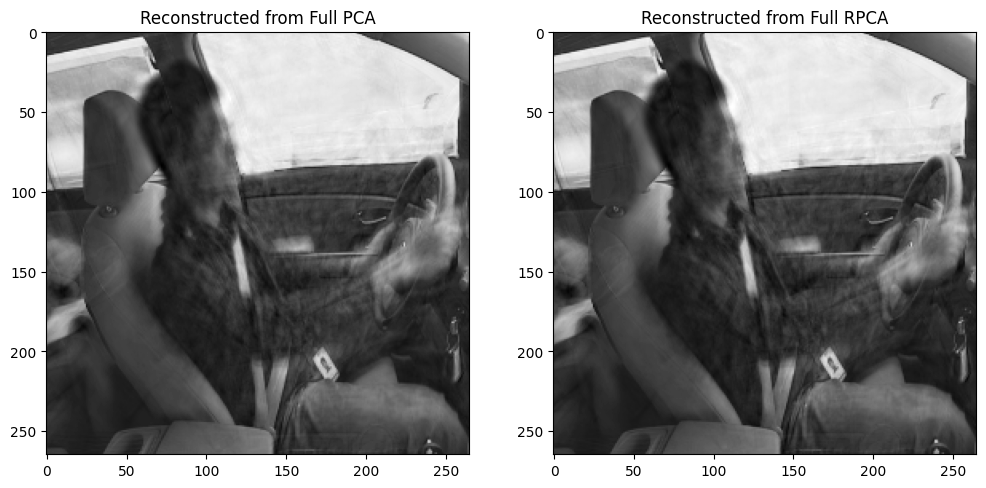

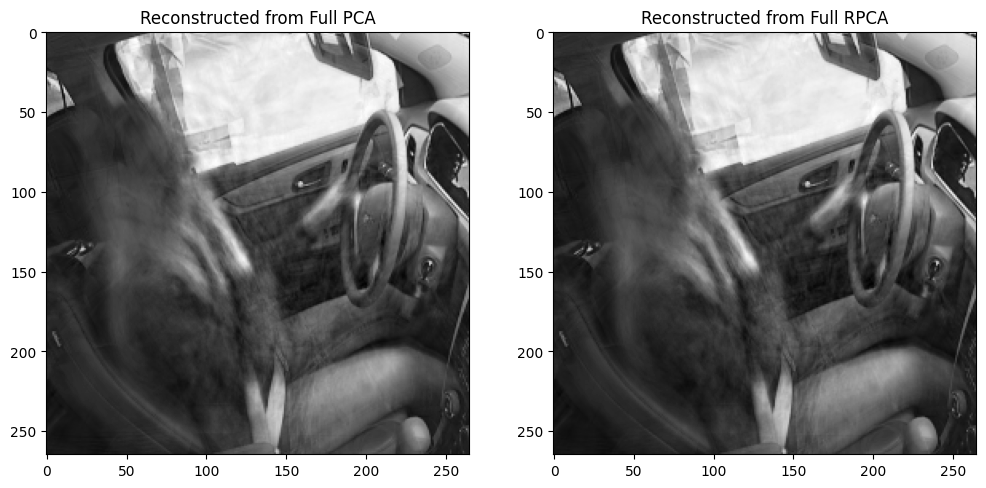

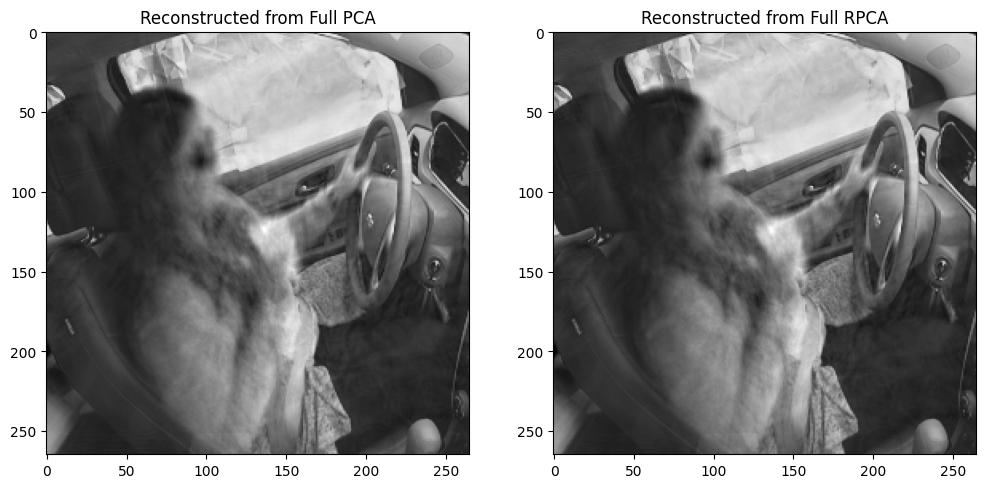

In [27]:
idx_to_reconstruct = 200
image_feature = image_features[idx_to_reconstruct]
low_dimensional_representation, reconstructed_image = reconstruct_image(pca, image_feature.reshape(1, -1))
r_low_dimensional_representation, r_reconstructed_image = reconstruct_image(rpca, image_feature.reshape(1, -1))
plt.figure(figsize=(12,12))
plt.subplot(1,2,1)
plt.imshow(reconstructed_image.reshape((img_height, img_width)), cmap=plt.cm.gray)
plt.title('Reconstructed from Full PCA')
plt.grid(False)
plt.subplot(1,2,2)
plt.imshow(r_reconstructed_image.reshape((img_height, img_width)), cmap=plt.cm.gray)
plt.title('Reconstructed from Full RPCA')
plt.grid(False)

idx_to_reconstruct2 = 20000
image_feature2 = image_features[idx_to_reconstruct2]
low_dimensional_representation, reconstructed_image2 = reconstruct_image(pca, image_feature2.reshape(1, -1))
r_low_dimensional_representation, r_reconstructed_image2 = reconstruct_image(rpca, image_feature2.reshape(1, -1))
plt.figure(figsize=(12,12))
plt.subplot(1,2,1)
plt.imshow(reconstructed_image2.reshape((img_height, img_width)), cmap=plt.cm.gray)
plt.title('Reconstructed from Full PCA')
plt.grid(False)
plt.subplot(1,2,2)
plt.imshow(r_reconstructed_image2.reshape((img_height, img_width)), cmap=plt.cm.gray)
plt.title('Reconstructed from Full RPCA')
plt.grid(False)

idx_to_reconstruct3 = 15015
image_feature3 = image_features[idx_to_reconstruct3]
low_dimensional_representation, reconstructed_image3 = reconstruct_image(pca, image_feature3.reshape(1, -1))
r_low_dimensional_representation, r_reconstructed_image3 = reconstruct_image(rpca, image_feature3.reshape(1, -1))
plt.figure(figsize=(12,12))
plt.subplot(1,2,1)
plt.imshow(reconstructed_image3.reshape((img_height, img_width)), cmap=plt.cm.gray)
plt.title('Reconstructed from Full PCA')
plt.grid(False)
plt.subplot(1,2,2)
plt.imshow(r_reconstructed_image3.reshape((img_height, img_width)), cmap=plt.cm.gray)
plt.title('Reconstructed from Full RPCA')
plt.grid(False)

### Compare the root mean square error between PCA and randomize PCA

In [51]:
from sklearn.metrics import root_mean_squared_error

rmse = root_mean_squared_error(image_feature.reshape((img_height, img_width)), reconstructed_image.reshape((img_height, img_width)))
print("The root mean squared reconstruction error Using full PCA in the first image is:" ,rmse)

r_rmse = root_mean_squared_error(image_feature.reshape((img_height, img_width)), r_reconstructed_image.reshape((img_height, img_width)))
print("The root mean squared reconstruction error using randomize in the first image RPCA is:" ,r_rmse)

rmse2 = root_mean_squared_error(image_feature2.reshape((img_height, img_width)), reconstructed_image2.reshape((img_height, img_width)))
print("The root mean squared reconstruction error Using full PCA in the second image is:" ,rmse2)

r_rmse2 = root_mean_squared_error(image_feature2.reshape((img_height, img_width)), r_reconstructed_image2.reshape((img_height, img_width)))
print("The root mean squared reconstruction error using randomize in the second image RPCA is:" ,r_rmse2)

rmse3 = root_mean_squared_error(image_feature3.reshape((img_height, img_width)), reconstructed_image3.reshape((img_height, img_width)))
print("The root mean squared reconstruction error Using full PCA in the third image is:" ,rmse)

r_rmse3 = root_mean_squared_error(image_feature3.reshape((img_height, img_width)), r_reconstructed_image3.reshape((img_height, img_width)))
print("The root mean squared reconstruction error using randomize in the third image RPCA is:" ,rmse)

The root mean squared reconstruction error Using full PCA in the first image is: 12.547796799016234
The root mean squared reconstruction error using randomize in the first image RPCA is: 12.507702877560272
The root mean squared reconstruction error Using full PCA in the second image is: 11.972956783594826
The root mean squared reconstruction error using randomize in the second image RPCA is: 11.927638638125217
The root mean squared reconstruction error Using full PCA in the third image is: 12.547796799016234
The root mean squared reconstruction error using randomize in the third image RPCA is: 12.547796799016234


In [52]:
print("The difference between the mean squared reconstruction error between PCA and RPCA in the first image is:" ,rmse-r_rmse)
print("The difference between the mean squared reconstruction error between PCA and RPCA in the second image is:" ,rmse2-r_rmse2)
print("The difference between the mean squared reconstruction error between PCA and RPCA in the third image is:" ,rmse3-r_rmse3)

The difference between the mean squared reconstruction error between PCA and RPCA in the first image is: 0.0400939214559628
The difference between the mean squared reconstruction error between PCA and RPCA in the second image is: 0.04531814546960966
The difference between the mean squared reconstruction error between PCA and RPCA in the third image is: 0.043146098658723986


<p>Given that PCA is computationally more efficient than RPCA, the slight difference in reconstruction error further reinforces the argument that PCA is the better choice when computational speed and resource efficiency are priorities. RPCA’s added complexity and ability to filter out noise may not offer enough of an improvement in reconstruction quality to justify its higher computational cost. Although RPCA does provide marginally sharper reconstructions, the improvement is minimal, making PCA the more practical and efficient solution for our dataset. </p>

 <h4>- Closest image PCA</h4>


Randomized PCA select image number 397 image number 1
Full PCA select image number 397 image number 1


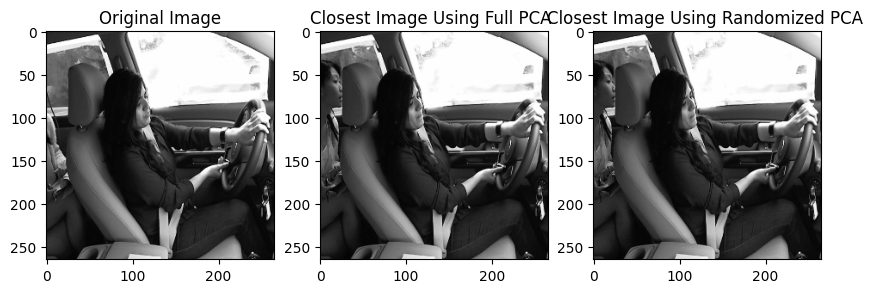

In [30]:
pca_features = pca.transform(image_features)
rpca_features = rpca.transform(image_features)

dist_matrix_pca = pairwise_distances(copy.deepcopy(pca_features),
                                     metric="seuclidean")

dist_matrix_rpca = pairwise_distances(copy.deepcopy(rpca_features),
                                     metric="seuclidean")

idx1 = 1
distances = copy.deepcopy(dist_matrix_pca[idx1,:])
distances[idx1] = np.inf # dont pick the same image!
idx2 = np.argmin(distances)

distances3 = copy.deepcopy(dist_matrix_rpca[idx1,:])
distances3[idx1] = np.inf # dont pick the same image!
idx3 = np.argmin(distances3)

plt.figure(figsize=(10,10))
plt.subplot(1,3,1)
plt.imshow(image_features[idx1].reshape((img_height, img_width)), cmap=plt.cm.gray)
plt.title("Original Image")
plt.grid(False)

plt.subplot(1,3,2)
plt.imshow(image_features[idx2].reshape((img_height, img_width)), cmap=plt.cm.gray)
plt.title("Closest Image Using Full PCA ")
plt.grid(False)

plt.subplot(1,3,3)
plt.imshow(image_features[idx3].reshape((img_height, img_width)), cmap=plt.cm.gray)
plt.title("Closest Image Using Randomized PCA ")
plt.grid(False)

print("Randomized PCA select image number",idx3, "image number", idx1)
print("Full PCA select image number",idx2, "image number", idx1)


### Compare the classification accuracy using the k-nearest neighbors classifier

<P>Based on the results of the KNN classification accuracies using PCA and RPCA across various values of \( k \), it is evident that the differences in performance between the two methods are consistently minimal. The mean accuracy differences between PCA and RPCA for each value of \( k \) are generally on the order of \( 10^{-4} \), which indicates that both techniques perform almost identically in terms of classification accuracy. For instance, at \( k = 3 \), the accuracy difference between PCA and RPCA is only -0.00011, while at \( k = 5 \), it is similarly small at -0.00011.

The small differences in accuracy suggest that **PCA is nearly as effective as RPCA** in capturing the essential features needed for accurate classification, even without the additional computational complexity that RPCA introduces. While RPCA aims to handle outliers and noise more effectively, the fact that **PCA performs so similarly** across all \( k \)-values, and even outperforms RPCA slightly at \( k = 4, 7, 9, 13, and 19**, reinforces the conclusion that PCA is a more practical choice in this scenario.

Given that **PCA is computationally more efficient** than RPCA, and the accuracy differences are negligible, **PCA should be preferred** for this particular task. The consistency in PCA’s performance across various \( k \) values demonstrates that it can achieve similar, if not better, results without the added complexity of RPCA. Therefore, PCA emerges as the better choice when balancing accuracy and computational speed, making it more suitable for practical implementations.</p>

k = 3: PCA Accuracy = 0.9909136299513385, RPCA Accuracy = 0.9910251126715168, PCA Accuracy-RPCA Accuracy=-0.00011148272017835748
k = 4: PCA Accuracy = 0.9892412803698727, RPCA Accuracy = 0.9891297976496943, PCA Accuracy-RPCA Accuracy=0.00011148272017835748
k = 5: PCA Accuracy = 0.9875132205079721, RPCA Accuracy = 0.9876247187679776, PCA Accuracy-RPCA Accuracy=-0.00011149826000556029
k = 6: PCA Accuracy = 0.9861196398862608, RPCA Accuracy = 0.9861753812463501, PCA Accuracy-RPCA Accuracy=-5.574136008923425e-05
k = 7: PCA Accuracy = 0.9850605074250849, RPCA Accuracy = 0.9849490247049065, PCA Accuracy-RPCA Accuracy=0.00011148272017835748
k = 8: PCA Accuracy = 0.9836111388238029, RPCA Accuracy = 0.9837226215439813, PCA Accuracy-RPCA Accuracy=-0.00011148272017835748
k = 9: PCA Accuracy = 0.9832209026836971, RPCA Accuracy = 0.9831651457837808, PCA Accuracy-RPCA Accuracy=5.575689991632604e-05
k = 12: PCA Accuracy = 0.9797090260599793, RPCA Accuracy = 0.9796532846998902, PCA Accuracy-RPCA Accur

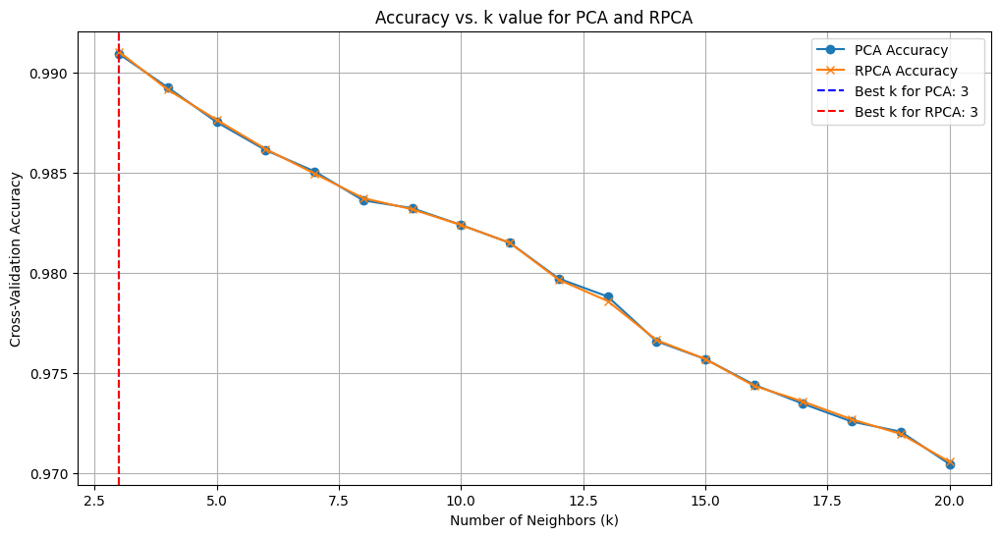

Best k for PCA: 3, PCA accuracy on test set: 99.35340022296543%
Best k for RPCA: 3, RPCA accuracy on test set: 99.35340022296543%


In [32]:
Data_pca_features = pca.transform(copy.deepcopy(image_features))
Data_rpca_features = rpca.transform(copy.deepcopy(image_features))


pca_train, pca_test, rpca_train, rpca_test, y_train, y_test = train_test_split(
    Data_pca_features, Data_rpca_features, labels, test_size=0.2, train_size=0.8, random_state=42
)


k_values = list(range(3, 21))


knn = KNeighborsClassifier()

param_grid = {'n_neighbors': k_values}
grid_pca = GridSearchCV(knn, param_grid, cv=5, scoring='accuracy', return_train_score=True)
grid_pca.fit(pca_train, y_train)


pca_k_values = grid_pca.cv_results_['param_n_neighbors']
pca_accuracies = grid_pca.cv_results_['mean_test_score']


grid_rpca = GridSearchCV(knn, param_grid, cv=5, scoring='accuracy', return_train_score=True)
grid_rpca.fit(rpca_train, y_train)


rpca_k_values = grid_rpca.cv_results_['param_n_neighbors']
rpca_accuracies = grid_rpca.cv_results_['mean_test_score']


different_k_values = []


for k, pca_acc, rpca_acc in zip(k_values, pca_accuracies, rpca_accuracies):
    if not np.isclose(pca_acc, rpca_acc):
        different_k_values.append(k)
        print(f"k = {k}: PCA Accuracy = {pca_acc}, RPCA Accuracy = {rpca_acc}, PCA Accuracy-RPCA Accuracy={pca_acc-rpca_acc}")


best_k_pca = grid_pca.best_params_['n_neighbors']
best_acc_pca = grid_pca.best_score_
best_k_rpca = grid_rpca.best_params_['n_neighbors']
best_acc_rpca = grid_rpca.best_score_


knn_pca = KNeighborsClassifier(n_neighbors=best_k_pca)
knn_pca.fit(pca_train, y_train)
acc_pca = accuracy_score(y_test, knn_pca.predict(pca_test))

knn_rpca = KNeighborsClassifier(n_neighbors=best_k_rpca)
knn_rpca.fit(rpca_train, y_train)
acc_rpca = accuracy_score(y_test, knn_rpca.predict(rpca_test))


plt.figure(figsize=(12, 6))
plt.plot(pca_k_values, pca_accuracies, label='PCA Accuracy', marker='o')
plt.plot(rpca_k_values, rpca_accuracies, label='RPCA Accuracy', marker='x')
plt.xlabel('Number of Neighbors (k)')
plt.ylabel('Cross-Validation Accuracy')
plt.title('Accuracy vs. k value for PCA and RPCA')
plt.axvline(best_k_pca, linestyle='--', color='blue', label=f'Best k for PCA: {best_k_pca}')
plt.axvline(best_k_rpca, linestyle='--', color='red', label=f'Best k for RPCA: {best_k_rpca}')
plt.legend()
plt.grid(True)
plt.show()


print(f"Best k for PCA: {best_k_pca}, PCA accuracy on test set: {100*acc_pca}%")
print(f"Best k for RPCA: {best_k_rpca}, RPCA accuracy on test set: {100*acc_rpca}%")


<p>In conclusion, after conducting a comprehensive computational comparison between PCA and RPCA, it is evident that PCA delivers slightly better performance than RPCA. This suggests that our dataset is relatively clean, with minimal noise or outliers, making PCA the more suitable technique for dimensionality reduction in this case. The findings reaffirm the importance of choosing the right method based on dataset characteristics, as RPCA is more effective in scenarios with significant noise, whereas PCA excels in cleaner datasets like ours.</p>

<h2>
3.4 Daisy-Feature Extraction</h2>
<p>
In this task, we will perform feature extraction on the images using the DAISY (Dense and Invariant Feature Descriptors) technique. DAISY is a widely used feature extraction method that computes descriptors for local image regions, capturing key structural information in a way that is both rotation-invariant and robust to lighting changes. By extracting DAISY descriptors, we can effectively summarize the critical features of the images.
</p>

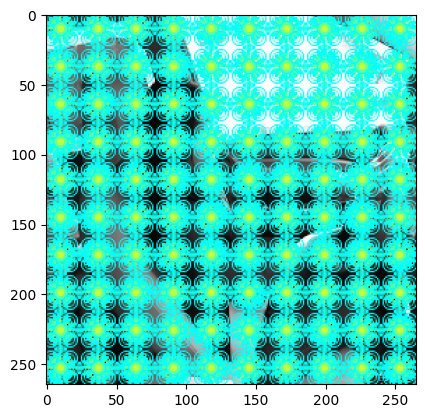

Features shape is: (10, 10, 520)
Number of features equal 52000


In [33]:
features, img_desc = daisy(image_features[1].reshape((img_height, img_width)), 
                           step=27, 
                           radius=10, 
                           rings=8, 
                           histograms=8, 
                           orientations=8, 
                           visualize=True)
plt.imshow(img_desc)
plt.grid(False)
plt.show()
print("Features shape is:", features.shape)
print("Number of features equal", features.shape[0]*features.shape[1]*features.shape[2])

In [34]:
def apply_daisy(row,shape):
    feat = daisy(row.reshape(shape), step=27, radius=10, 
                 rings=8, histograms=8, orientations=8, 
                 visualize=False)
    return feat.reshape((-1))

In [35]:
%time daisy_features = np.apply_along_axis(apply_daisy, 1, image_features, (img_height, img_width))
print(daisy_features.shape)

CPU times: total: 1h 14min 36s
Wall time: 1h 15min 20s
(22424, 52000)


<h2>
3.5 Daisy- k-nearest neighbors classifier
</h2>
<p>
The initial exploration of DAISY features, using pairwise distances to locate the closest image in the dataset, indicates that this feature extraction technique shows promise for the prediction task. The method effectively retrieves images from the same target class, suggesting that DAISY features capture meaningful patterns in the data. To further assess the potential of this technique for image classification, building a k-nearest neighbors (KNN) classifier on the extracted features will provide a concrete measure of classification accuracy, further evaluating whether DAISY features are suitable for the prediction task.
</p>

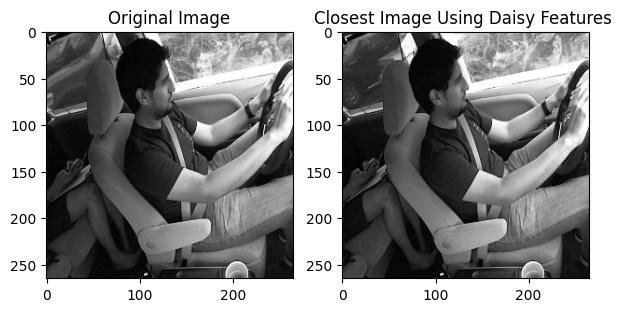

In [36]:
dist_matrix = pairwise_distances(daisy_features, metric="seuclidean")

idx1 = 500
distances = copy.deepcopy(dist_matrix[idx1,:])
distances[idx1] = np.inf # dont pick the same image!
idx2 = np.argmin(distances)

plt.figure(figsize=(7,10))
plt.subplot(1,2,1)
plt.imshow(image_features[idx1].reshape( (img_height, img_width)), cmap=plt.cm.gray)
plt.title("Original Image")
plt.grid(False)

plt.subplot(1,2,2)
plt.imshow(image_features[idx2].reshape( (img_height, img_width)), cmap=plt.cm.gray)
plt.title("Closest Image Using Daisy Features ")
plt.grid(False)

<h4>- Nearest Neighbor Classifier to See Actual Classification Performance</h4>

Best k value: 3
Cross-validated accuracy with best k: 97.26%
Test set accuracy with best k: 97.24%


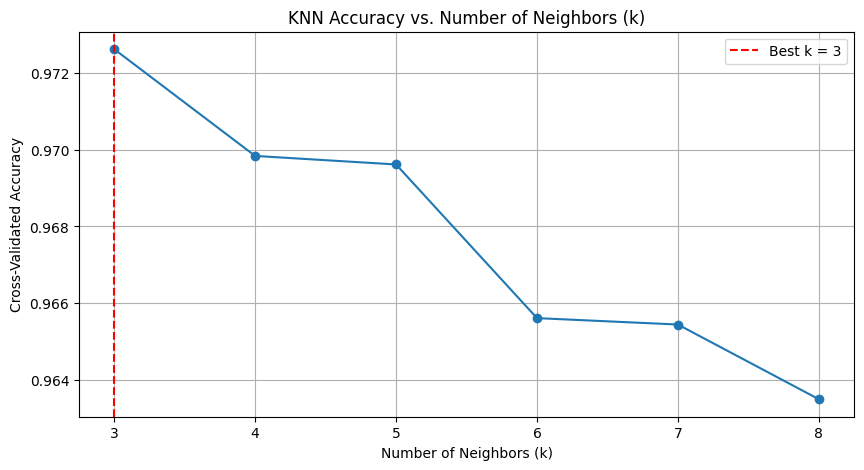

In [37]:
dsy_train, dsy_test, y_train, y_test = train_test_split(daisy_features, labels, test_size=0.2, train_size=0.8, random_state=42)
k_values = list(range(3, 9))

knn = KNeighborsClassifier()
param_grid = {'n_neighbors': k_values}
grid_search = GridSearchCV(knn, param_grid, cv=5, scoring='accuracy', return_train_score=True)
grid_search.fit(dsy_train, y_train)
best_k = grid_search.best_params_['n_neighbors']
best_acc = grid_search.best_score_
knn_best = KNeighborsClassifier(n_neighbors=best_k)
knn_best.fit(dsy_train, y_train)
acc_dsy = accuracy_score(knn_best.predict(dsy_test), y_test)
print(f"Best k value: {best_k}")
print(f"Cross-validated accuracy with best k: {100*best_acc:.2f}%")
print(f"Test set accuracy with best k: {100*acc_dsy:.2f}%")
k_values = grid_search.cv_results_['param_n_neighbors']
accuracies = grid_search.cv_results_['mean_test_score']

plt.figure(figsize=(10, 5))
plt.plot(k_values, accuracies, marker='o', linestyle='-')
plt.xlabel('Number of Neighbors (k)')
plt.ylabel('Cross-Validated Accuracy')
plt.title('KNN Accuracy vs. Number of Neighbors (k)')
plt.grid(True)
plt.axvline(best_k, color='r', linestyle='--', label=f'Best k = {best_k}')
plt.legend()
plt.show()


<p>Based on the KNN accuracy results, the feature extraction method used in this prediction task shows strong promise. The optimal number of neighbors (\(k\)) was found to be **3**, yielding a cross-validated accuracy of **97.26%** and a similar test set accuracy of **97.24%**, indicating that the model generalizes well to unseen data. This close alignment between training and test performance suggests that the features extracted (likely using DAISY or a similar technique) provide highly informative and discriminative representations for the KNN classifier.

As the number of neighbors (\(k\)) was varied from **3** to **8**, there was a gradual decline in accuracy, which is expected in KNN models. At **\(k = 3\)**, the classifier has the most detailed decision boundaries, capturing more localized patterns in the feature space. As \(k\) increases to **4** and **5**, the accuracy slightly decreases, maintaining around **97%**, but it continues to drop as \(k\) increases further. By the time \(k = 8\)**, the cross-validated accuracy drops to around **96.4%**. This decline occurs because larger \(k\) values tend to smooth out the decision boundaries, leading to more general predictions that may miss subtle distinctions between neighboring data points.

The fact that the model performs best at **\(k = 3\)** suggests that the extracted features are sufficiently detailed and well-distributed in the feature space, allowing the model to make accurate predictions when it focuses on the closest few neighbors. Overall, the high accuracy at \(k = 3\) and the reasonable performance even with larger \(k\) values highlight that the feature extraction method is very effective for this task, enabling the classifier to reliably distinguish between different classes. Further testing with other classifiers or exploring feature comparisons across classes could offer additional insights into the strength and robustness of the features.

<b>Based on both the pairwise distance results for identifying the closest images and the high KNN accuracy obtained, we can confidently say that the DAISY feature extraction technique is promising for this prediction task.
Moreover, the KNN classifier achieved a cross-validated accuracy of 97.26% with k=3, which further confirms the effectiveness of the DAISY features in distinguishing between different classes. The model maintained high performance even with varying k values, showing that the features are robust enough to provide consistent accuracy across different neighborhood sizes.we can conclude that the DAISY feature extraction method is indeed well-suited and promising for this particular prediction task.</b>
</p>

<h2>
4. Key Point Matching</h2>
<p>
In this process, we utilize keypoint matching with DAISY to establish feature correspondences between two images. First, we identify keypoints in both images using the Shi-Tomasi corner detector, which pinpoints salient regions in the images that will serve as reference points for feature matching. Once the keypoints are identified, DAISY descriptors are applied to each keypoint region in both images, extracting detailed descriptors that capture unique characteristics of the local image structure around each keypoint. 

The next step involves feature matching using brute force matching, where we employ the `match_descriptors` function to compare the extracted DAISY descriptors from one image to the other. By evaluating every descriptor pair and selecting the best matches based on Euclidean distance, we identify the most similar features between the two images.

This approach offers a robust method for detecting and matching keypoints, combining the power of the Shi-Tomasi corner detector and the DAISY descriptor to capture meaningful visual elements. Through brute force matching, we identify corresponding features that can be used for tasks such as image alignment or object recognition. The flexibility of this method also allows for parameter tuning to optimize the matching process for specific needs.
</p>

In [38]:
def plot_Key_Point_Matching(image_feature1, image_feature2,h,w):
    image1_gray = image_feature1.reshape((h,w))
    image2_gray =image_feature2.reshape((h,w))
    keypoints1 = corner_peaks(corner_shi_tomasi(image1_gray), min_distance=4,
                          threshold_rel=0.1)
    keypoints2 = corner_peaks(corner_shi_tomasi(image2_gray), min_distance=4,
                          threshold_rel=0.1)


    radius = 4
    steps=10
    num_rings = 8
    num_histograms = 8
    num_orientations = 8

    desc1 = []
    for kp in keypoints1:
        region = image1_gray[int(kp[0] - radius):int(kp[0] + radius + 1),
                         int(kp[1] - radius):int(kp[1] + radius + 1)]
        desc = daisy(region, step=steps, radius=radius, rings=num_rings,
                 histograms=num_histograms, orientations=num_orientations).flatten()
        desc1.append(desc)

    desc2 = []
    for kp in keypoints2:
        region = image2_gray[int(kp[0] - radius):int(kp[0] + radius + 1),
                         int(kp[1] - radius):int(kp[1] + radius + 1)]
        desc = daisy(region, step=steps, radius=radius, rings=num_rings,
                 histograms=num_histograms, orientations=num_orientations).flatten()
        desc2.append(desc)

    desc1 = np.array(desc1)
    desc2 = np.array(desc2)


    matches = match_descriptors(desc1, desc2,metric='euclidean',cross_check=True)

    fig, ax= plt.subplots(1, 1, figsize=(10, 8))
    plt.gray()
    plot_matches(ax, image1_gray, image2_gray, keypoints1, keypoints2, matches)
    ax.axis('off')
    plt.show()

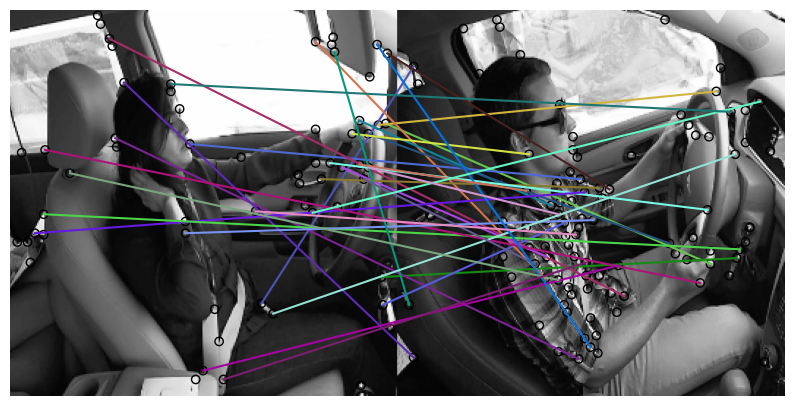

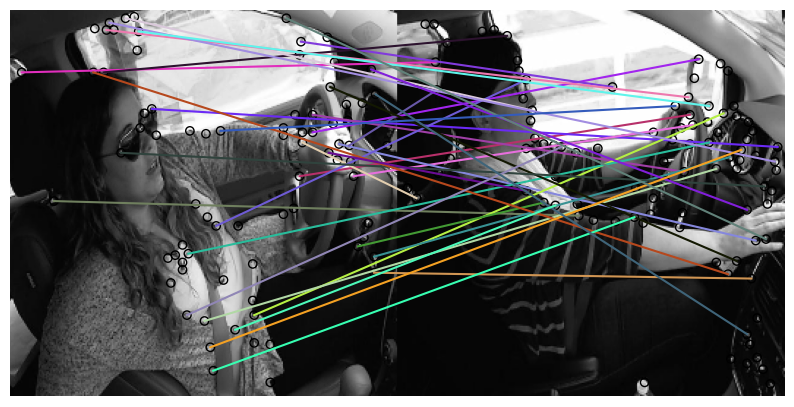

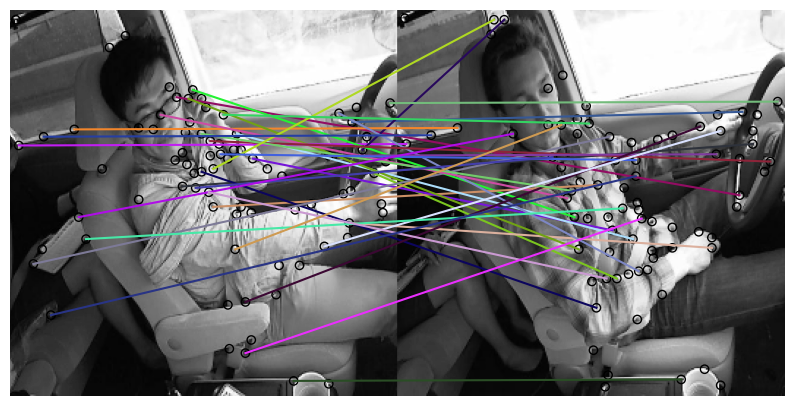

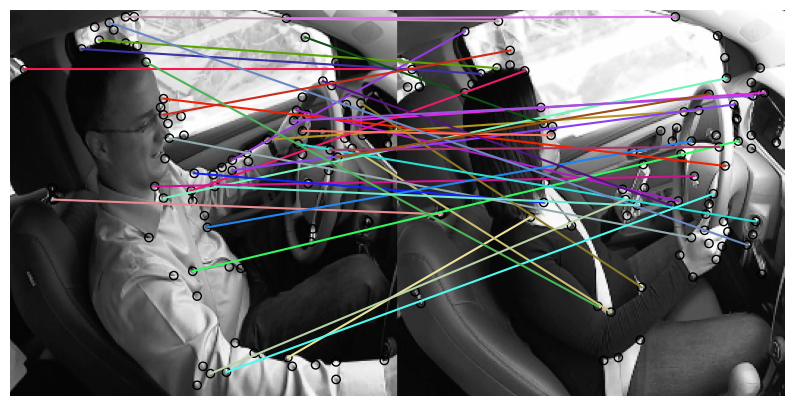

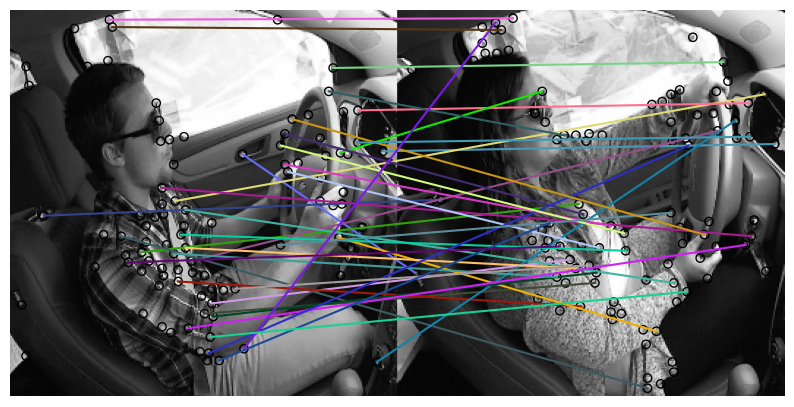

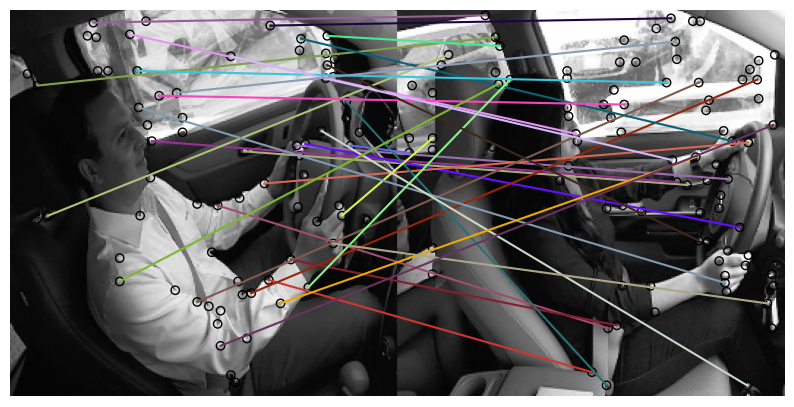

In [39]:
plot_Key_Point_Matching(image_features[18945], image_features[1023],img_height, img_width)
plot_Key_Point_Matching(image_features[16764], image_features[12521],img_height, img_width)
plot_Key_Point_Matching(image_features[19789], image_features[20436],img_height, img_width)
plot_Key_Point_Matching(image_features[13598], image_features[8234],img_height, img_width)
plot_Key_Point_Matching(image_features[151], image_features[276],img_height, img_width)
plot_Key_Point_Matching(image_features[17], image_features[10],img_height, img_width)

<p>The images show a significant number of matching features between the paired comparisons, as evidenced by the colored lines connecting keypoints across each pair. These matching features are concentrated around the drivers' and passengers' heads, arms, and hands, which are consistent areas of interest due to their similar postures—seated with hands on the steering wheel. This suggests that the feature extraction method is effectively capturing common and relevant patterns across these images. When the two images are from the same class, such as both drivers being in similar positions, the number of matching features tends to increase, particularly around the hands and heads. In contrast, areas like the background (car seats, windows) have fewer matching features, likely due to less distinctive patterns in these regions. Overall, the images demonstrate a good number of matching features, indicating the effectiveness of the feature extraction method in identifying consistent and important patterns across similar scenes.</p>

<h4>Does it perform better than not using key point matching?</h4>
<p>
To evaluate the performance of different feature extraction methods, we employed KNN to classify images based on keypoint features and compared the results with the classification accuracy obtained using the DAISY feature extracted from the entire image. The accuracy of keypoint-based classification ranged from **51.51%** to **52.84%**, with the highest accuracy achieved at **52.84%** when \(k=6\). In contrast, the DAISY feature yielded a much higher test set accuracy of **97.24%** with the best \(k\) value \(k=3\), significantly outperforming the keypoint-based approach. Considering both the accuracy metrics and the fact that utilizing keypoint features does not provide a significant improvement, while requiring extensive computational resources and time, opting for the DAISY feature extraction method is a more efficient and favorable choice in this scenario.</p>

Accuracy for k=3: 51.51%
Accuracy for k=4: 52.66%
Accuracy for k=5: 52.33%
Accuracy for k=6: 52.84%
Accuracy for k=7: 52.06%
Accuracy for k=8: 52.42%
Best k value: 6
Highest accuracy with best k: 52.84%


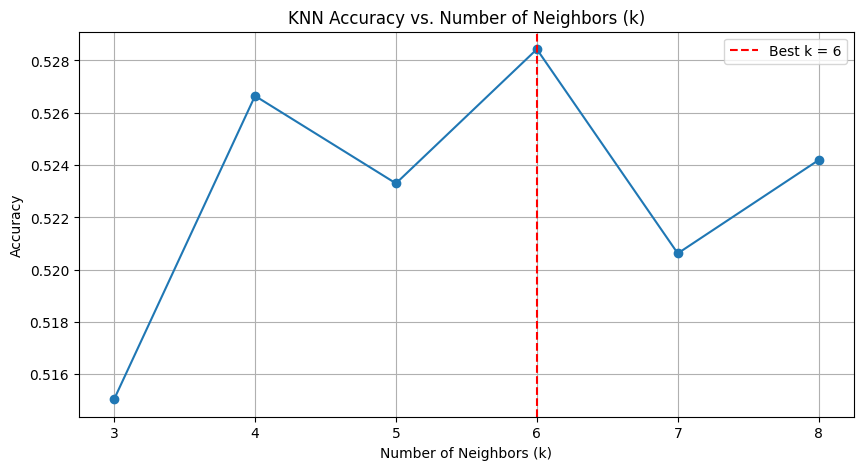

In [41]:
radius = 10
steps = 27
num_rings = 8
num_histograms = 8
num_orientations = 8

keypoints_feature = []


for i in range(df.shape[0]):
    image_gray = image_features[i].reshape((img_height, img_width))
    keypoints = corner_peaks(corner_shi_tomasi(image_gray), min_distance=27, threshold_rel=0.1)
    desc_list = []

  
    for kp in keypoints:
        # Ensure the region does not go out of bounds
        if (kp[0] - radius) >= 0 and (kp[0] + radius + 1) <= img_height and (kp[1] - radius) >= 0 and (kp[1] + radius + 1) <= img_width:
            region = image_gray[int(kp[0] - radius):int(kp[0] + radius + 1), int(kp[1] - radius):int(kp[1] + radius + 1)]
            desc = daisy(region, step=steps, radius=radius, rings=num_rings, histograms=num_histograms, orientations=num_orientations).flatten()
            desc_list.append(desc)

   
    if desc_list:
        keypoints_feature.append(np.concatenate(desc_list).flatten())


max_length = len(max(keypoints_feature, key=len))
b_sparse = lil_matrix((len(keypoints_feature), max_length), dtype=np.float32)


for i, feature_vector in enumerate(keypoints_feature):
    b_sparse[i, :len(feature_vector)] = feature_vector
    
b_sparse_csr = csr_matrix(b_sparse)
knn_dsy_train, knn_dsy_test, y_train, y_test = train_test_split(b_sparse_csr, labels, test_size=0.2, train_size=0.8, random_state=42)


k_values = list(range(3, 9))  # Adjust the range based on dataset size

accuracy_scores = []


for k in k_values:
    # Initialize KNN classifier with current k value
    knn_dsy_key = KNeighborsClassifier(n_neighbors=k)
    

    knn_dsy_key.fit(knn_dsy_train, y_train)
    

    y_pred = knn_dsy_key.predict(knn_dsy_test)
    

    acc_dsy_key = accuracy_score(y_test, y_pred)
    accuracy_scores.append(acc_dsy_key)


    print(f"Accuracy for k={k}: {100 * acc_dsy_key:.2f}%")


best_k = k_values[np.argmax(accuracy_scores)]
best_accuracy = max(accuracy_scores)


print(f"Best k value: {best_k}")
print(f"Highest accuracy with best k: {100 * best_accuracy:.2f}%")


plt.figure(figsize=(10, 5))
plt.plot(k_values, accuracy_scores, marker='o', linestyle='-')
plt.xlabel('Number of Neighbors (k)')
plt.ylabel('Accuracy')
plt.title('KNN Accuracy vs. Number of Neighbors (k)')
plt.grid(True)
plt.axvline(best_k, color='r', linestyle='--', label=f'Best k = {best_k}')
plt.legend()
plt.show()


<p><br><br>The keypoint matching process, as illustrated in the image, shows that only **13 keypoint matches** were found between the two images. While these matches indicate some level of correspondence, the number of keypoint matches is relatively low compared to the amount of information provided by using the full DAISY feature vector, which represents the entire image. 

Additionally, the **Euclidean distance similarity score** without keypoint matching is **2.37**, which suggests that using the full DAISY descriptor provides a more comprehensive measure of similarity across the images. Furthermore, keypoint matching involves brute force comparison of keypoints, which is **computationally expensive** and time-consuming. Given the limited improvement in accuracy and the increased computational cost, the trade-off does not appear to be worthwhile for this particular application.</p>

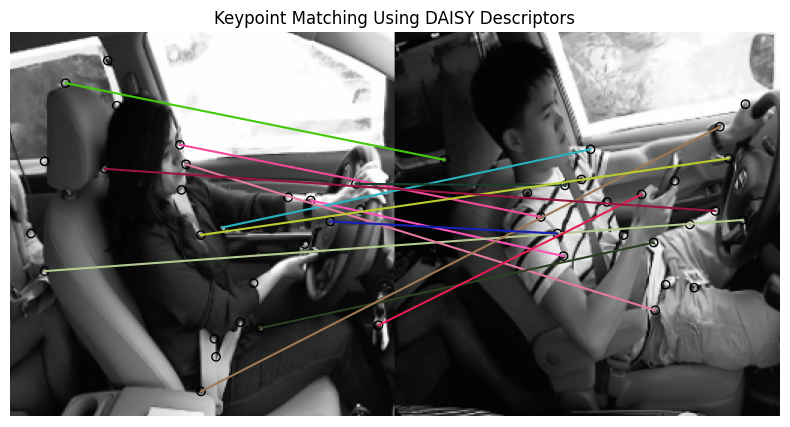

Number of keypoint matches: 13
Similarity score without keypoint matching (Euclidean distance): 2.37


In [42]:
image1 = resize(image_features[1].reshape((img_height, img_width)), (256, 256))
image2 = resize(image_features[3201].reshape((img_height, img_width)), (256, 256))


keypoints1 = corner_peaks(corner_shi_tomasi(image1), min_distance=10, threshold_rel=0.1)
keypoints2 = corner_peaks(corner_shi_tomasi(image2), min_distance=10, threshold_rel=0.1)


def extract_daisy_descriptors(image, keypoints, radius=4):
    descriptors = []
    for kp in keypoints:
        if (kp[0] - radius) >= 0 and (kp[0] + radius + 1) <= image.shape[0] and (kp[1] - radius) >= 0 and (kp[1] + radius + 1) <= image.shape[1]:
            region = image[int(kp[0] - radius):int(kp[0] + radius + 1), int(kp[1] - radius):int(kp[1] + radius + 1)]
            desc = daisy(region, step=10, radius=radius, rings=8, histograms=8, orientations=8).flatten()
            descriptors.append(desc)
    return np.array(descriptors)


descriptors1 = extract_daisy_descriptors(image1, keypoints1)
descriptors2 = extract_daisy_descriptors(image2, keypoints2)


matches = match_descriptors(descriptors1, descriptors2, metric='euclidean', cross_check=True)


fig, ax = plt.subplots(1, 1, figsize=(10, 5))
plt.gray()
plot_matches(ax, image1, image2, keypoints1, keypoints2, matches)
ax.axis('off')
ax.set_title("Keypoint Matching Using DAISY Descriptors")
plt.show()


full_daisy1 = daisy(image1, step=10, radius=4, rings=8, histograms=8, orientations=8).flatten()
full_daisy2 = daisy(image2, step=10, radius=4, rings=8, histograms=8, orientations=8).flatten()


full_match_score = np.linalg.norm(full_daisy1 - full_daisy2)

print(f"Number of keypoint matches: {len(matches)}")
print(f"Similarity score without keypoint matching (Euclidean distance): {full_match_score:.2f}")


<p><br><br>The keypoint matching process, as illustrated in the image, shows that only **14 keypoint matches** were found between the two images. While these matches indicate some level of correspondence, the number of keypoint matches is relatively low compared to the amount of information provided by using the full DAISY feature vector, which represents the entire image. 

Additionally, the **Euclidean distance similarity score** without keypoint matching is **2.59**, which suggests that using the full DAISY descriptor provides a more comprehensive measure of similarity across the images. Furthermore, keypoint matching involves brute force comparison of keypoints, which is **computationally expensive** and time-consuming. Given the limited improvement in accuracy and the increased computational cost, the trade-off does not appear to be worthwhile for this particular application.</p>

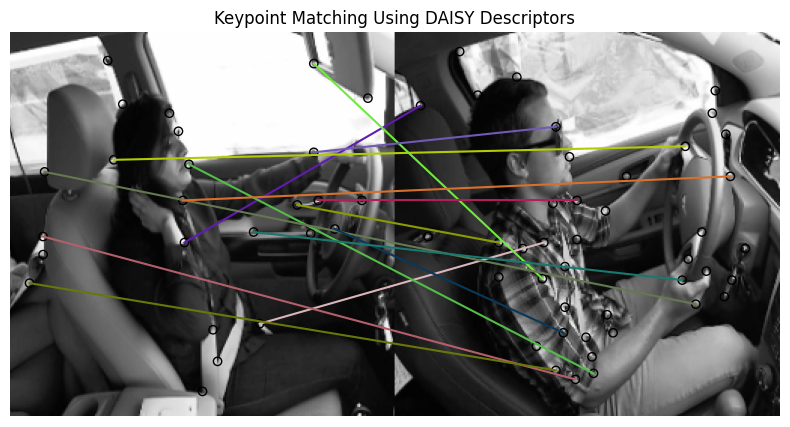

Number of keypoint matches: 14
Similarity score without keypoint matching (Euclidean distance): 2.59


In [43]:
image1 = resize(image_features[18945].reshape((img_height, img_width)), (256, 256))
image2 = resize(image_features[1023].reshape((img_height, img_width)), (256, 256))


keypoints1 = corner_peaks(corner_shi_tomasi(image1), min_distance=10, threshold_rel=0.1)
keypoints2 = corner_peaks(corner_shi_tomasi(image2), min_distance=10, threshold_rel=0.1)


def extract_daisy_descriptors(image, keypoints, radius=4):
    descriptors = []
    for kp in keypoints:
        if (kp[0] - radius) >= 0 and (kp[0] + radius + 1) <= image.shape[0] and (kp[1] - radius) >= 0 and (kp[1] + radius + 1) <= image.shape[1]:
            region = image[int(kp[0] - radius):int(kp[0] + radius + 1), int(kp[1] - radius):int(kp[1] + radius + 1)]
            desc = daisy(region, step=10, radius=radius, rings=8, histograms=8, orientations=8).flatten()
            descriptors.append(desc)
    return np.array(descriptors)


descriptors1 = extract_daisy_descriptors(image1, keypoints1)
descriptors2 = extract_daisy_descriptors(image2, keypoints2)

matches = match_descriptors(descriptors1, descriptors2, metric='euclidean', cross_check=True)


fig, ax = plt.subplots(1, 1, figsize=(10, 5))
plt.gray()
plot_matches(ax, image1, image2, keypoints1, keypoints2, matches)
ax.axis('off')
ax.set_title("Keypoint Matching Using DAISY Descriptors")
plt.show()

full_daisy1 = daisy(image1, step=10, radius=4, rings=8, histograms=8, orientations=8).flatten()
full_daisy2 = daisy(image2, step=10, radius=4, rings=8, histograms=8, orientations=8).flatten()

full_match_score = np.linalg.norm(full_daisy1 - full_daisy2)

print(f"Number of keypoint matches: {len(matches)}")
print(f"Similarity score without keypoint matching (Euclidean distance): {full_match_score:.2f}")


<p><br><br>Based on the analysis, keypoint matching using DAISY descriptors does not significantly improve performance compared to using the full DAISY descriptor for classification. 
In conclusion, keypoint matching using DAISY descriptors does not offer a significant advantage over using the full DAISY descriptor. The latter provides a more efficient and effective approach for image classification or similarity tasks.</p>

<h2>
5. References</h2>
<ul>
<li>Kaggle. State Farm Distracted Driver Detection Dataset:<a href="https://www.kaggle.com/competitions/state-farm-distracted-driver-detection/code">https://www.kaggle.com/competitions/state-farm-distracted-driver-detection/code</a></li>
<li>Mean squared error loss in Logistic Regression: <a href=https://chat.openai.com/chat>https://https://chat.openai.com/chat</a></li>    
<li>OpenAI. (2024). ChatGPT [Large language model]. <a href=https://chat.openai.com/chat>https://https://chat.openai.com/chat</a></li>
<li>Dimension Reduction and Images Lecture code</li></ul>
